In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import json
from IPython.display import clear_output

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

/usr/lib/python3.7/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


# Importando e descrevendo os dados

O conjunto de dados escolhido foi o 'bank.csv' disponivel em https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

In [3]:
data = pd.read_csv('bank.csv', sep=';')

As colunas disponíveis na versão menor dos dados são:
- age: valor numerico representando a idade do cliente
- job: valor categorico representando o tipo de trabalho executado pelo cliente
- marital: valor categorico representando estado civil do cliente
- education: valor categorico representando o nivel de educacao do cliente
- default: has credit in default?
- housing: valor categorico/booleano representando se o cliente tem emprestimo na casa
- loan: valor categorico/booleano representando se o cliente tem emprestimo
- contact: valor categorico representando o tipo de comunicacao com o cliente
- month: valor categorico representando o mes do ultimo contato
- day: valor numerico representando o dia do mes do ultimo contato 
- campaign: valor numerico representando o numero de contatos com o cliente na ultima campanha
- pdays: valor numerico representando o numero de dias passados entre o ultimo contato da campanha anterior
- previous: valor numerico representando o numero de contatos realizados antes dessa campanha
- poutcome: valor categorico representando o resultado da ultima campanha com esse cliente

- duration: valor numerico representando a duracao do ultimo contato em segundos. Nota importante: esse atributo esta diretamente relacionado com a variavel de saida (duration = 0 -> y = 'no'). Assim, essa variavel deve ser incluida apenas em benchmarking e descartada em treinos.

In [4]:
boolean_columns = ['default', 'housing', 'loan', 'y']
categorical_columns = ['job', 'marital', 'education', 'contact', 'month', 'poutcome']
numerical_columns = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

feature_columns = ['default', 'housing', 
                   'loan', 'job', 'marital', 
                   'education', 'contact', 
                   'month', 'poutcome', 'age', 
                   'balance', 'day',
                   'campaign', 'pdays', 'previous']

In [5]:
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no


# Estatistica dos dados
https://www.kaggle.com/kashnitsky/topic-1-exploratory-data-analysis-with-pandas

https://towardsdatascience.com/5-quick-and-easy-data-visualizations-in-python-with-code-a2284bae952f

https://towardsdatascience.com/introduction-to-data-visualization-in-python-89a54c97fbed

https://www.analyticsvidhya.com/blog/2016/01/complete-tutorial-learn-data-science-python-scratch-2/

In [6]:
 data.apply(lambda x: sum(x.isnull()),axis=0)

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [7]:
total_len = data['y'].count()
class_no_len = data[data['y'] == 'no']['y'].count()
class_no_perc = class_no_len / total_len
class_yes_len = data[data['y'] == 'yes']['y'].count()
class_yes_perc = class_yes_len / total_len
print(f'Y = No -> {class_no_len} : {class_no_perc*100}%')
print(f'Y = Yes -> {class_yes_len} : {class_yes_perc*100}%')

Y = No -> 4000 : 88.47600088476001%
Y = Yes -> 521 : 11.523999115239992%


In [8]:
data.mean()

age           41.170095
balance     1422.657819
day           15.915284
duration     263.961292
campaign       2.793630
pdays         39.766645
previous       0.542579
dtype: float64

In [8]:
data[data['y'] == 'yes'].mean()

age           42.491363
balance     1571.955854
day           15.658349
duration     552.742802
campaign       2.266795
pdays         68.639155
previous       1.090211
dtype: float64

In [9]:
data[data['y'] == 'no'].mean()

age           40.99800
balance     1403.21175
day           15.94875
duration     226.34750
campaign       2.86225
pdays         36.00600
previous       0.47125
dtype: float64

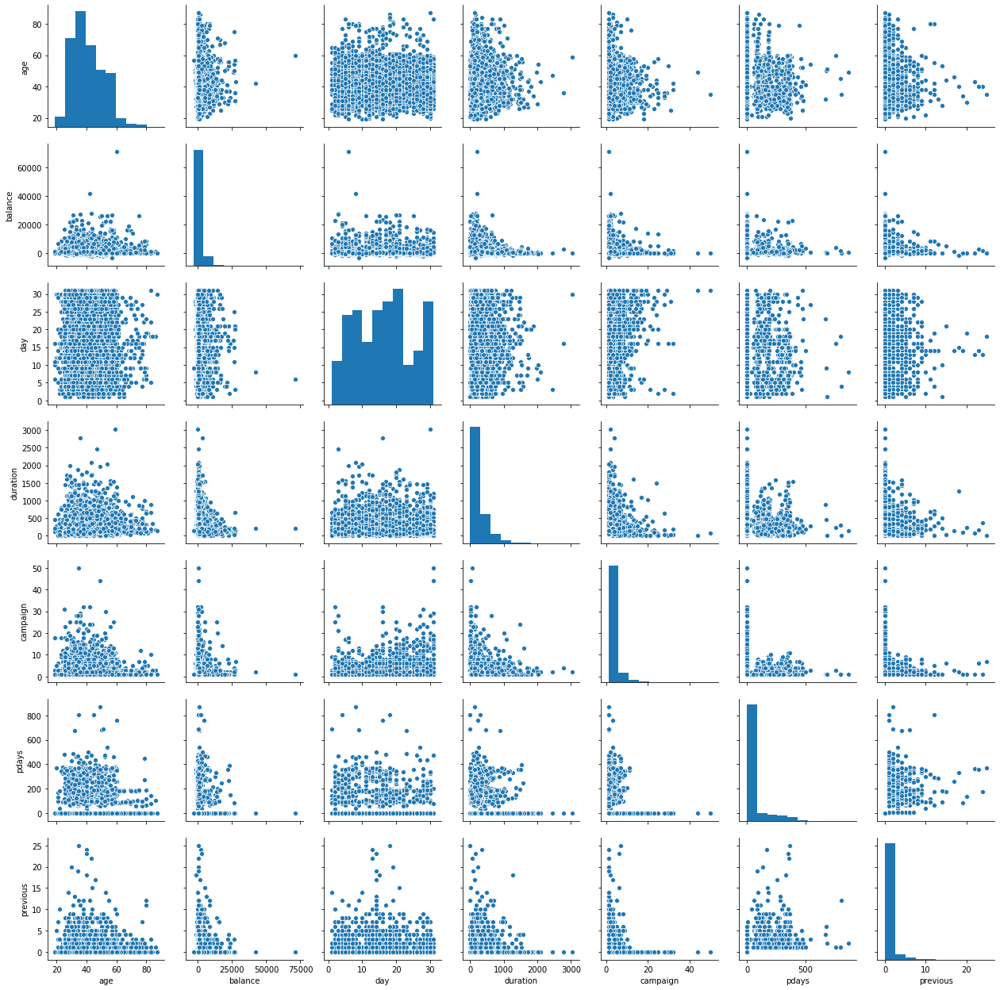

In [38]:
sns.pairplot(data[numerical_columns])

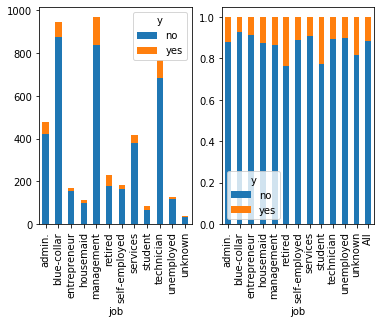

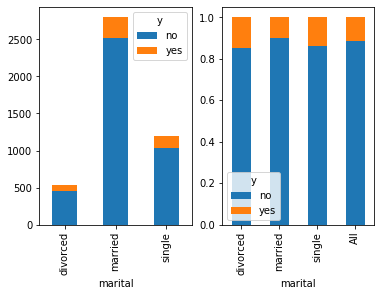

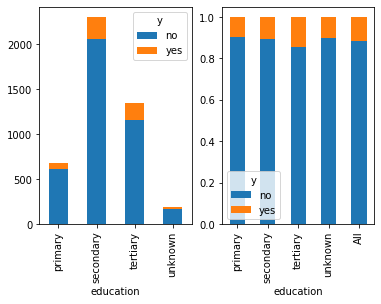

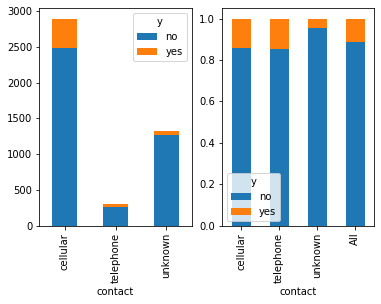

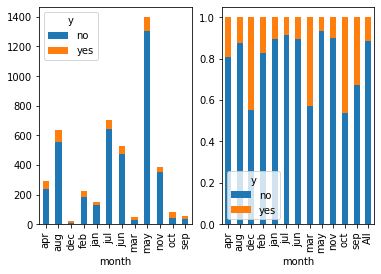

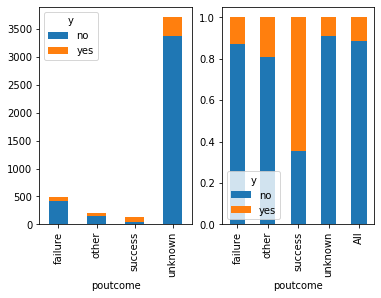

In [85]:
for cat in categorical_columns:
    
    count_data = pd.crosstab(data[cat], data['y'])#.sort_values(by=['no'])
    norm_data = pd.crosstab(data[cat], data['y'], margins=True, margins_name='All', normalize='index')

    fig, (ax1, ax2) = plt.subplots(ncols=2)
    
    count_data.plot(kind='bar', stacked=True, grid=False, ax=ax1)
    norm_data.plot(kind='bar', stacked=True, grid=False, ax=ax2)

    plt.show()

# Categorizando e quebrando o dataset em casos de treino e teste

In [5]:
replace_map = {}
for cat in categorical_columns+boolean_columns:
    replace_map[cat] = {}
    for idx, val in enumerate(data[cat].unique()):
        replace_map[cat][val] = idx

In [11]:
print(json.dumps(replace_map, indent=4, sort_keys=True))

{
    "contact": {
        "cellular": 0,
        "telephone": 2,
        "unknown": 1
    },
    "default": {
        "no": 0,
        "yes": 1
    },
    "education": {
        "primary": 0,
        "secondary": 1,
        "tertiary": 2,
        "unknown": 3
    },
    "housing": {
        "no": 0,
        "yes": 1
    },
    "job": {
        "admin.": 7,
        "blue-collar": 3,
        "entrepreneur": 6,
        "housemaid": 9,
        "management": 2,
        "retired": 10,
        "self-employed": 4,
        "services": 1,
        "student": 8,
        "technician": 5,
        "unemployed": 0,
        "unknown": 11
    },
    "loan": {
        "no": 0,
        "yes": 1
    },
    "marital": {
        "divorced": 2,
        "married": 0,
        "single": 1
    },
    "month": {
        "apr": 2,
        "aug": 5,
        "dec": 11,
        "feb": 4,
        "jan": 6,
        "jul": 7,
        "jun": 3,
        "mar": 10,
        "may": 1,
        "nov": 8,
        "oct": 0,
    

In [6]:
data.replace(replace_map, inplace=True)

In [7]:
dataX = data.drop(["y", "duration"], axis=1)
dataY = data["y"]#.values

In [8]:
X_train, X_test, Y_train, Y_test = train_test_split(dataX, dataY, test_size=0.20)

In [9]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# KNN
https://www.datacamp.com/community/tutorials/k-nearest-neighbor-classification-scikit-learn

In [16]:
KNN_classifier = KNeighborsClassifier(n_neighbors=5)
KNN_classifier.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [17]:
Y_KNN_pred = KNN_classifier.predict(X_test)

In [18]:
print(f'Accuracy: {accuracy_score(Y_test, Y_KNN_pred)}')

Accuracy: 0.8685082872928177


In [19]:
print('Report:')
print(classification_report(Y_test, Y_KNN_pred))

Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       789
           1       0.46      0.14      0.21       116

    accuracy                           0.87       905
   macro avg       0.67      0.56      0.57       905
weighted avg       0.83      0.87      0.84       905



In [20]:
print('Matrix:')
print(confusion_matrix(Y_test, Y_KNN_pred))

Matrix:
[[770  19]
 [100  16]]


# Naive Bayes
https://www.datacamp.com/community/tutorials/naive-bayes-scikit-learn

In [21]:
NB_classifier = GaussianNB()
NB_classifier.fit(X_train, Y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [22]:
Y_NB_pred = NB_classifier.predict(X_test)

In [23]:
print(f'Accuracy: {accuracy_score(Y_test, Y_NB_pred)}')

Accuracy: 0.8022099447513812


In [24]:
print('Report:')
print(classification_report(Y_test, Y_NB_pred))

Report:
              precision    recall  f1-score   support

           0       0.90      0.87      0.88       789
           1       0.28      0.35      0.31       116

    accuracy                           0.80       905
   macro avg       0.59      0.61      0.60       905
weighted avg       0.82      0.80      0.81       905



In [25]:
print('Matrix:')
print(confusion_matrix(Y_test, Y_NB_pred))

Matrix:
[[685 104]
 [ 75  41]]


# DECISION TREE
https://www.datacamp.com/community/tutorials/decision-tree-classification-python

In [10]:
DT_classifier = DecisionTreeClassifier()
DT_classifier.fit(X_train, Y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [11]:
Y_DT_pred = DT_classifier.predict(X_test)

In [12]:
print(f'Accuracy: {accuracy_score(Y_test, Y_DT_pred)}')

Accuracy: 0.8088397790055248


In [13]:
print('Report:')
print(classification_report(Y_test, Y_DT_pred))

Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       809
           1       0.18      0.22      0.20        96

    accuracy                           0.81       905
   macro avg       0.54      0.55      0.54       905
weighted avg       0.83      0.81      0.82       905



In [14]:
print('Matrix:')
print(confusion_matrix(Y_test, Y_DT_pred))

Matrix:
[[711  98]
 [ 75  21]]


In [15]:
dot_data = StringIO()

export_graphviz(DT_classifier, 
                out_file=dot_data,  
                filled=True, 
                rounded=True,
                special_characters=True,
                feature_names = feature_columns,
                class_names=['0','1'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 

graph.write_png('diabetes.png')
Image(graph.create_png())

# MLP
https://www.kdnuggets.com/2016/10/beginners-guide-neural-networks-python-scikit-learn.html/2

In [ ]:
# code here

# SVM
https://stackabuse.com/implementing-svm-and-kernel-svm-with-pythons-scikit-learn/

https://www.datacamp.com/community/tutorials/svm-classification-scikit-learn-python

In [36]:
# code here